In [1]:
import os

os.chdir('/rds/general/user/ma11115/home/pl_temp_fit/') 

In [2]:
import pandas as pd
from pl_temp_fit import test_FIT_NEW
num_samples = [5000]
num_tune = [1000]
sigma = [0.02]

temperature_list = [
    [300.0, 250.0, 200.0, 150.0, 80.0],
    [300.0, 150.0, 80.0],
    [300.0],
]
number_free_parameters = [2, 5]
Temp_std_err_list = [2,10,0.1]
hws_std_err_list = [0.002,0.01,0.005]
relative_intensity_std_error_list = [0.05,0.01]

parameter_list = test_FIT_NEW.generate_parameter_list(
    num_samples, num_tune, sigma, temperature_list, number_free_parameters,
    Temp_std_err_list, hws_std_err_list, relative_intensity_std_error_list)

df = pd.DataFrame(parameter_list)
df

Running on PyMC v5.10.3


,num_samples,num_tune,sigma,temperature_list,number_free_parameters,Temp_std_err,hws_std_err,relative_intensity_std_error
0,500,100,0.01,"[300.0, 150.0, 80.0]",2,5.0,0.001,0.01
1,5000,1000,0.02,"[300.0, 250.0, 200.0, 150.0, 80.0]",2,2.0,0.002,0.05
2,5000,1000,0.02,"[300.0, 250.0, 200.0, 150.0, 80.0]",2,2.0,0.002,0.01
3,5000,1000,0.02,"[300.0, 250.0, 200.0, 150.0, 80.0]",2,2.0,0.010,0.05
4,5000,1000,0.02,"[300.0, 250.0, 200.0, 150.0, 80.0]",2,2.0,0.010,0.01
...,...,...,...,...,...,...,...,...
104,5000,1000,0.02,[300.0],5,0.1,0.002,0.01
105,5000,1000,0.02,[300.0],5,0.1,0.010,0.05
106,5000,1000,0.02,[300.0],5,0.1,0.010,0.01
107,5000,1000,0.02,[300.0],5,0.1,0.005,0.05


In [17]:
import glob
import arviz
from pl_temp_fit import PLPYMCModel,ELPYMCModel
import importlib
importlib.reload(PLPYMCModel)
importlib.reload(ELPYMCModel)

<module 'pl_temp_fit.ELPYMCModel' from '/rds/general/user/ma11115/home/pl_temp_fit/src/pl_temp_fit/ELPYMCModel.py'>

In [19]:
# load results from exp_results folder

E_true = 1.5
sigma_true = 0.02
LI_true = 0.09
L0_true = 0.1
H0_true = 0.15
true_parameters = [E_true, sigma_true, LI_true, L0_true, H0_true]
model = PLPYMCModel.PLPYMCModel()
folder = glob.glob('test_results_PL/*/*')
exp_data_dict = {}
model_dict = {}
for f in folder:
    name = f.split('/')[-1]
    if 'idata.nc' in os.listdir(f):
        exp_results = arviz.from_netcdf(f'{f}/idata.nc')
        exp_data_dict[name] = exp_results
    if 'model.nc' in os.listdir(f):
        model_2 = model.load(f'{f}/model.nc')
        model_dict[name] = model_2

In [35]:
# load results from exp_results folder

true_parameters_EL=[1.4, 9, 0.1, 0.1, 0.15]
model_EL = ELPYMCModel.ELPYMCModel()
folder = glob.glob('test_results_EL/*/*')
exp_data_dict_EL = {}
model_dict_EL = {}
for f in folder:
    name = f.split('/')[-1]
    if 'idata.nc' in os.listdir(f):
        exp_results = arviz.from_netcdf(f'{f}/idata.nc')
        exp_data_dict_EL[name] = exp_results
    if 'model.nc' in os.listdir(f):
        model_2 = model_EL.load(f'{f}/model.nc')
        model_dict_EL[name] = model_2

In [37]:
from pl_temp_fit import test_FIT_NEW
from pl_temp_fit import test_EL_fit
from pl_temp_fit import fit_experimental_PLT
import numpy as np  
# generate the data
temperature_list = [300.0, 250.0, 200.0, 150.0, 80.0]
hws = np.arange(0.8, 2, 0.02)


In [42]:
model_dict_EL

{'num_samples=50 num_tune=50 sigma=0.01 temperature_list=3 number_free_parameters=2 Temp_std_err=5 hws_std_err=0.001 relative_intensity_std_error=0.01': <pl_temp_fit.ELPYMCModel.ELPYMCModel at 0x152d4527e8d0>,
 'num_samples=6000 num_tune=1000 sigma=0.01 temperature_list=5 number_free_parameters=6 Temp_std_err=0.1 hws_std_err=0.001 relative_intensity_std_error=0.01': <pl_temp_fit.ELPYMCModel.ELPYMCModel at 0x152d45bb5d90>,
 'num_samples=6000 num_tune=1000 sigma=0.01 temperature_list=3 number_free_parameters=3 Temp_std_err=10 hws_std_err=0.001 relative_intensity_std_error=0.05': <pl_temp_fit.ELPYMCModel.ELPYMCModel at 0x152d4537ce10>,
 'num_samples=6000 num_tune=1000 sigma=0.01 temperature_list=3 number_free_parameters=3 Temp_std_err=2 hws_std_err=0.001 relative_intensity_std_error=0.05': <pl_temp_fit.ELPYMCModel.ELPYMCModel at 0x152d4513f3d0>,
 'num_samples=6000 num_tune=1000 sigma=0.01 temperature_list=3 number_free_parameters=3 Temp_std_err=0.1 hws_std_err=0.001 relative_intensity_std

num_samples=6000 num_tune=1000 sigma=0.01 temperature_list=3 number_free_parameters=5 Temp_std_err=0.1 hws_std_err=0.001 relative_intensity_std_error=0.01 5879605010666461.0
         mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
E       1.396  0.008   1.384    1.403      0.004    0.003       4.0       4.0   
k_EXCT  9.627  1.296   8.003   11.505      0.648    0.496       4.0       4.0   
LI      0.095  0.009   0.082    0.107      0.004    0.003       4.0       4.0   
L0      0.095  0.008   0.083    0.102      0.004    0.003       4.0       4.0   
H0      0.155  0.006   0.149    0.164      0.003    0.002       4.0       4.0   

               r_hat  
E       5.879605e+15  
k_EXCT  5.879605e+15  
LI      5.574349e+15  
L0      5.879605e+15  
H0      5.879605e+15  
------------------
------------------


/rds/general/user/ma11115/home/anaconda3/envs/pymc_env/lib/python3.11/site-packages/arviz/stats/density_utils.py:487: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")
/rds/general/user/ma11115/home/anaconda3/envs/pymc_env/lib/python3.11/site-packages/arviz/stats/density_utils.py:487: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")
/rds/general/user/ma11115/home/anaconda3/envs/pymc_env/lib/python3.11/site-packages/arviz/stats/density_utils.py:487: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")
/rds/general/user/ma11115/home/anaconda3/envs/pymc_env/lib/python3.11/site-packages/arviz/stats/density_utils.py:487: UserWarning: Your data appears to have a single value or no finite

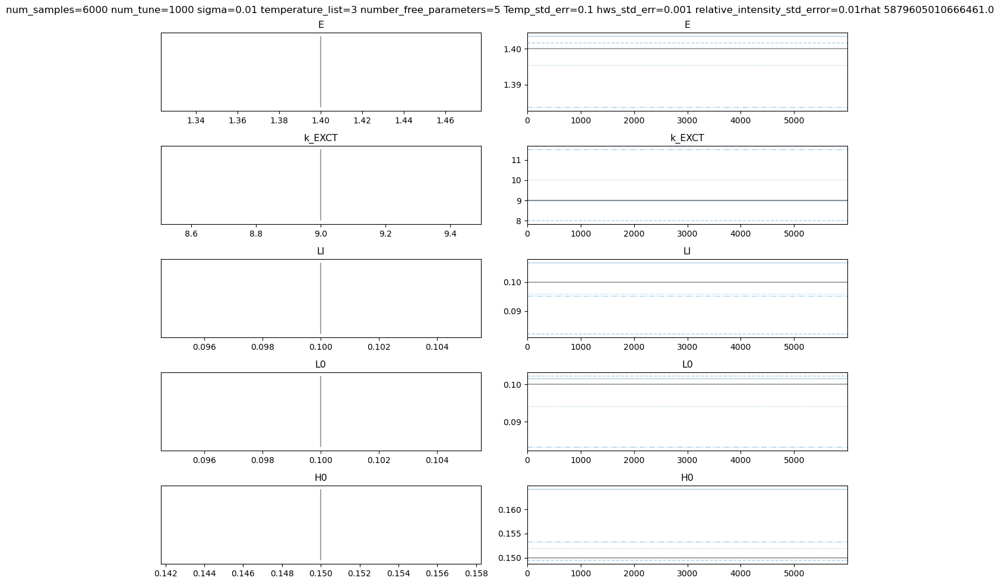

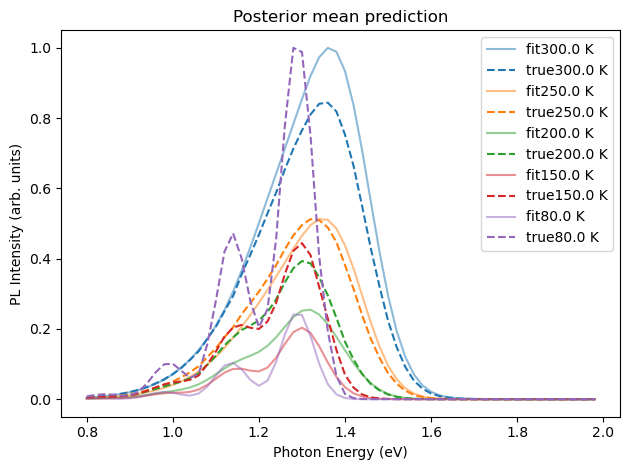

In [44]:
#temperature_list = [300.0, 150.0, 80.0]

for name,model in model_dict_EL.items():
    if int(name.split('number_free_parameters=')[1][0]) ==5 and int(name.split('num_samples=')[1][0:3]) >500 :
        df_summary = arviz.summary(model.idata)
        print(name, df_summary['r_hat'].values.max())
        
    #if df_summary['r_hat'].values.max() < 1.1:
        #print(name, df_summary['r_hat'].values.max())
        print(df_summary)
        print('------------------')
        print('------------------')
        fig = model.plot_trace(true_parameters_EL, save_folder="", savefig=False)
        fig.suptitle(name+f"rhat {df_summary['r_hat'].values.max()}")
        fig.show()
        
        model_config = model.model_config.copy()

        entries_to_remove = ('E', 'LI', 'L0', 'H0', 'sigma_E')
        for k in entries_to_remove:
            model_config.pop(k, None)
        
        truemodel_pl, true_parameters = test_EL_fit.generate_data(temperature_list, hws, **model_config,true_parameters=true_parameters_EL)
        #test_EL_fit.plot_generated_data(truemodel_pl, temperature_list, hws, "", savefig=False, model_config=model_config)
        truemodel_pl=truemodel_pl/np.max(truemodel_pl.reshape(-1))
        model.plot_posterior_prediction(truemodel_pl,  temperature_list, hws, save_folder="", savefig=False)
        break

            

        


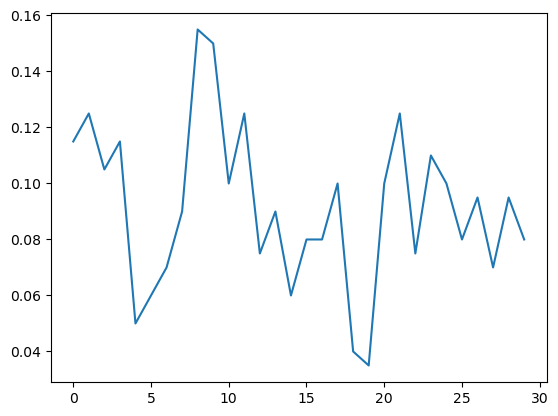

In [59]:
accep = np.array(model.idata.sample_stats.accepted)[0]
import matplotlib.pyplot as plt
x= 500
tune_step = 200
plt.plot([accep[x:x+tune_step].sum()/tune_step for x in range(0, len(accep), tune_step)])#plt.yscale('log')
#plt.ylim(0.005,100)

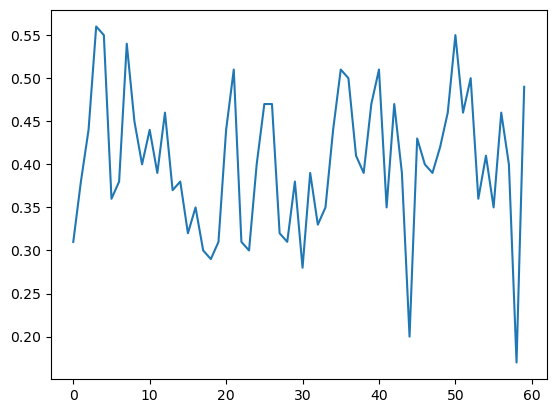

num_samples=4000 num_tune=2000 sigma=0.01 temperature_list=3 number_free_parameters=5 Temp_std_err=2 hws_std_err=0.005 relative_intensity_std_error=0.01 1.05
          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
E        1.500  0.001   1.499    1.501        0.0      0.0      95.0   
sigma_E  0.020  0.000   0.020    0.020        0.0      0.0     403.0   
LI       0.090  0.000   0.089    0.091        0.0      0.0     289.0   
L0       0.101  0.001   0.099    0.101        0.0      0.0     100.0   
H0       0.150  0.000   0.150    0.150        0.0      0.0     357.0   

         ess_tail  r_hat  
E           500.0   1.05  
sigma_E     831.0   1.01  
LI          753.0   1.01  
L0          288.0   1.05  
H0          793.0   1.01  
------------------
------------------
num_samples=4000 num_tune=2000 sigma=0.01 temperature_list=3 number_free_parameters=5 Temp_std_err=10 hws_std_err=0.005 relative_intensity_std_error=0.01 1.1
num_samples=4000 num_tune=2000 sigma=0.01 temperatu

/rds/general/user/ma11115/home/pl_temp_fit/src/pl_temp_fit/PLPYMCModel.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


num_samples=50 num_tune=10 sigma=0.0001 temperature_list=3 number_free_parameters=2 Temp_std_err=5 hws_std_err=0.001 relative_intensity_std_error=0.01 1.95
num_samples=4000 num_tune=2000 sigma=0.01 temperature_list=3 number_free_parameters=5 Temp_std_err=2 hws_std_err=0.001 relative_intensity_std_error=0.01 1.05
          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
E        1.501  0.001   1.500    1.502        0.0      0.0     246.0   
sigma_E  0.020  0.000   0.020    0.020        0.0      0.0     153.0   
LI       0.089  0.000   0.088    0.090        0.0      0.0     313.0   
L0       0.101  0.000   0.101    0.102        0.0      0.0     188.0   
H0       0.150  0.000   0.150    0.150        0.0      0.0     241.0   

         ess_tail  r_hat  
E           516.0   1.01  
sigma_E     370.0   1.05  
LI          850.0   1.01  
L0          512.0   1.01  
H0          662.0   1.02  
------------------
------------------
num_samples=500 num_tune=100 sigma=0.01 temperature_l

/rds/general/user/ma11115/home/anaconda3/envs/pymc_env/lib/python3.11/site-packages/arviz/plots/backends/matplotlib/traceplot.py:217: UserWarning: A valid var_name should be provided, found {'sigma_E', 'L0', 'H0'} expected from {'LI', 'E'}
  warnings.warn(


num_samples=4000 num_tune=2000 sigma=0.01 temperature_list=3 number_free_parameters=5 Temp_std_err=2 hws_std_err=0.005 relative_intensity_std_error=0.05 1.03
          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
E        1.503  0.001   1.502    1.504        0.0      0.0     446.0   
sigma_E  0.019  0.000   0.019    0.019        0.0      0.0     422.0   
LI       0.091  0.000   0.090    0.091        0.0      0.0     281.0   
L0       0.106  0.000   0.105    0.106        0.0      0.0     435.0   
H0       0.150  0.000   0.149    0.150        0.0      0.0     318.0   

         ess_tail  r_hat  
E           929.0   1.01  
sigma_E     614.0   1.03  
LI          950.0   1.00  
L0          947.0   1.01  
H0         1124.0   1.00  
------------------
------------------
num_samples=4000 num_tune=2000 sigma=0.01 temperature_list=3 number_free_parameters=5 Temp_std_err=10 hws_std_err=0.001 relative_intensity_std_error=0.05 1.01
          mean     sd  hdi_3%  hdi_97%  mcse_mean 

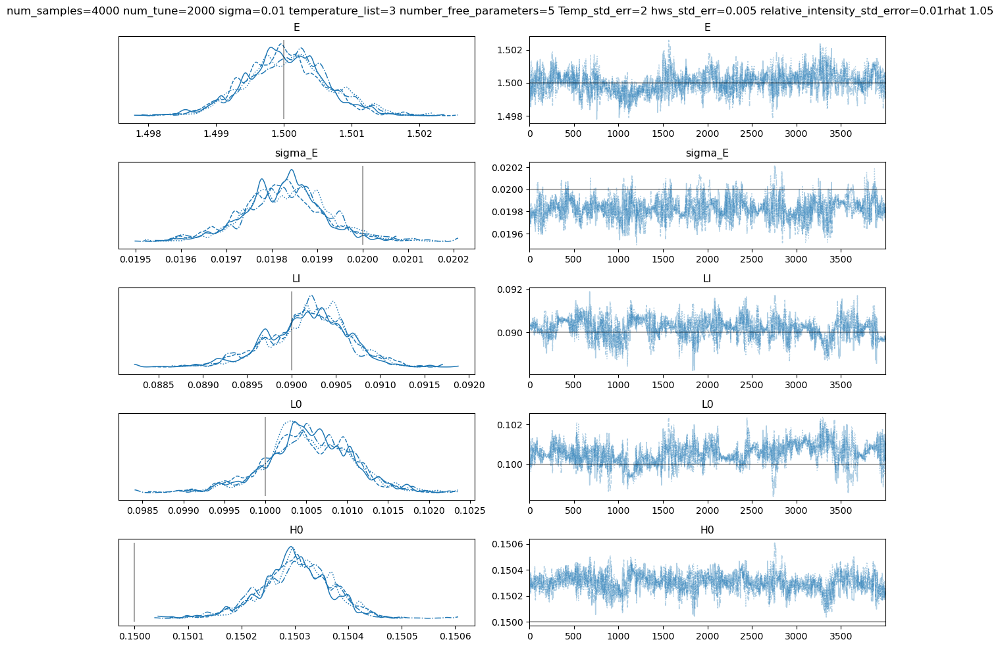

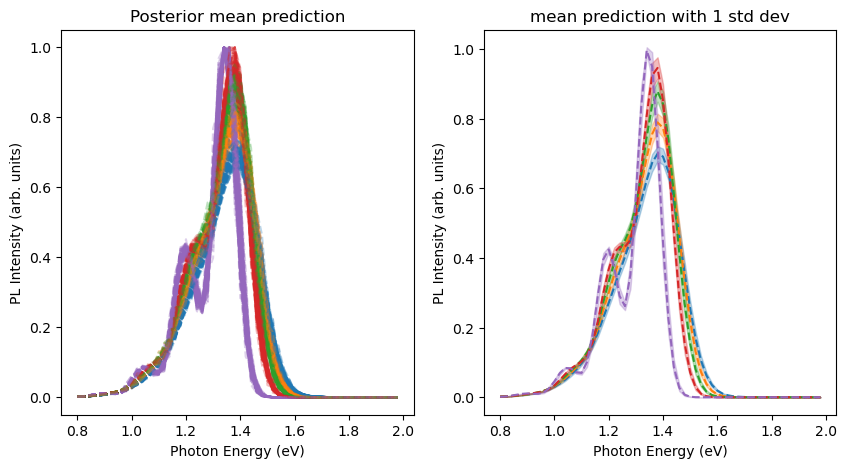

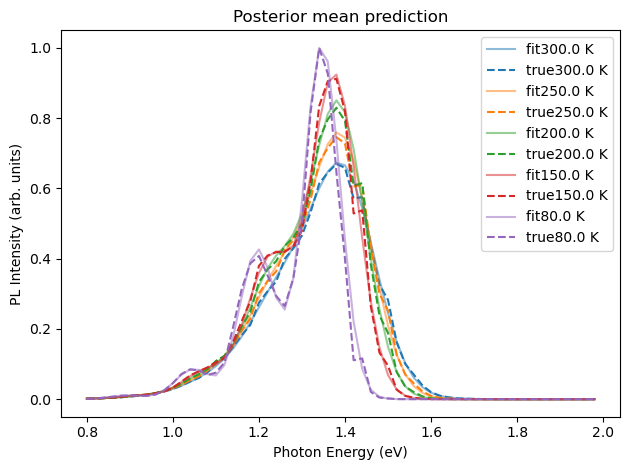

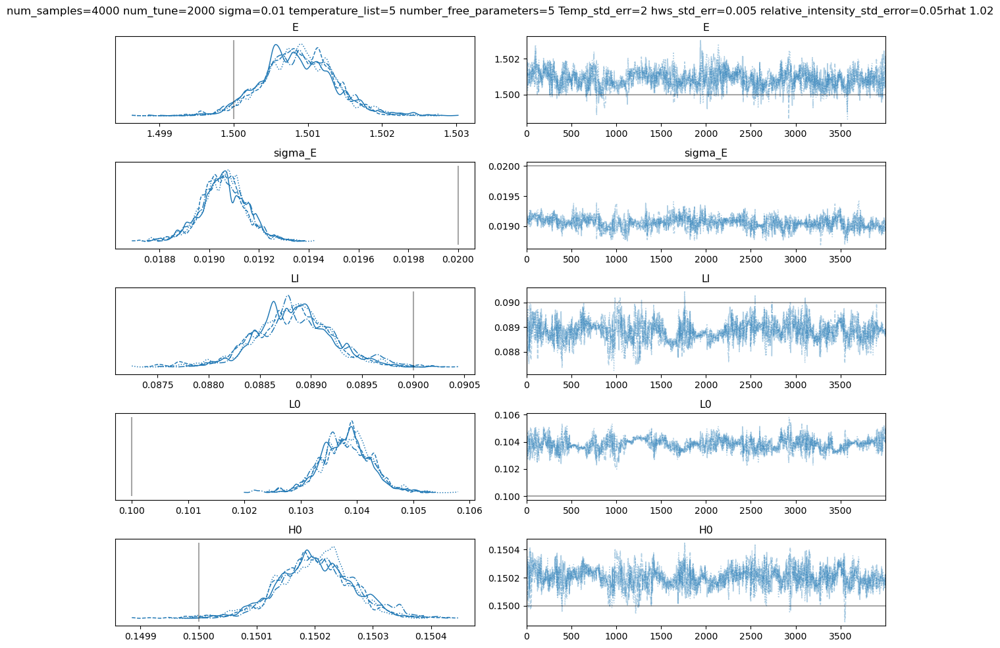

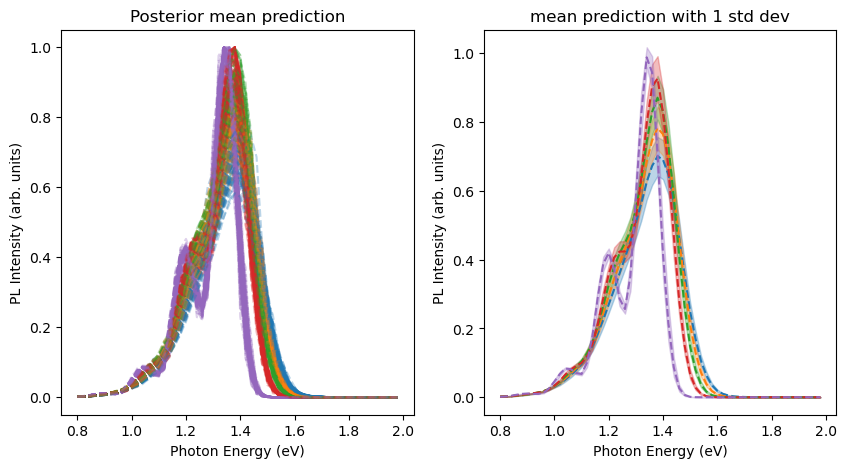

...

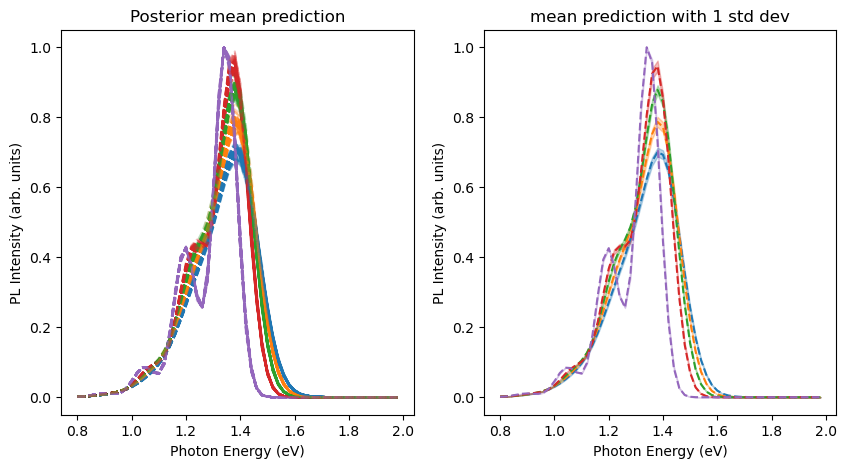

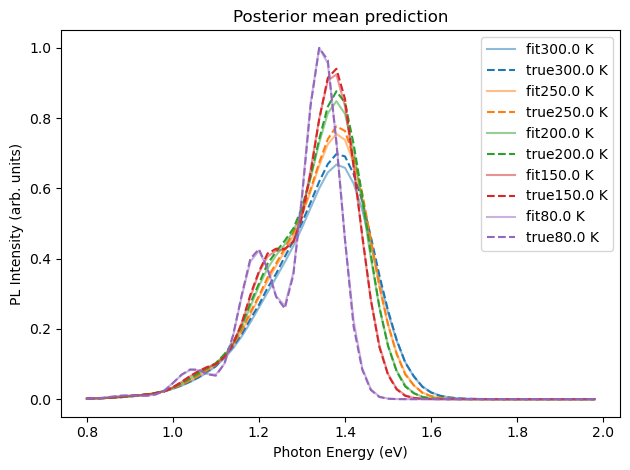

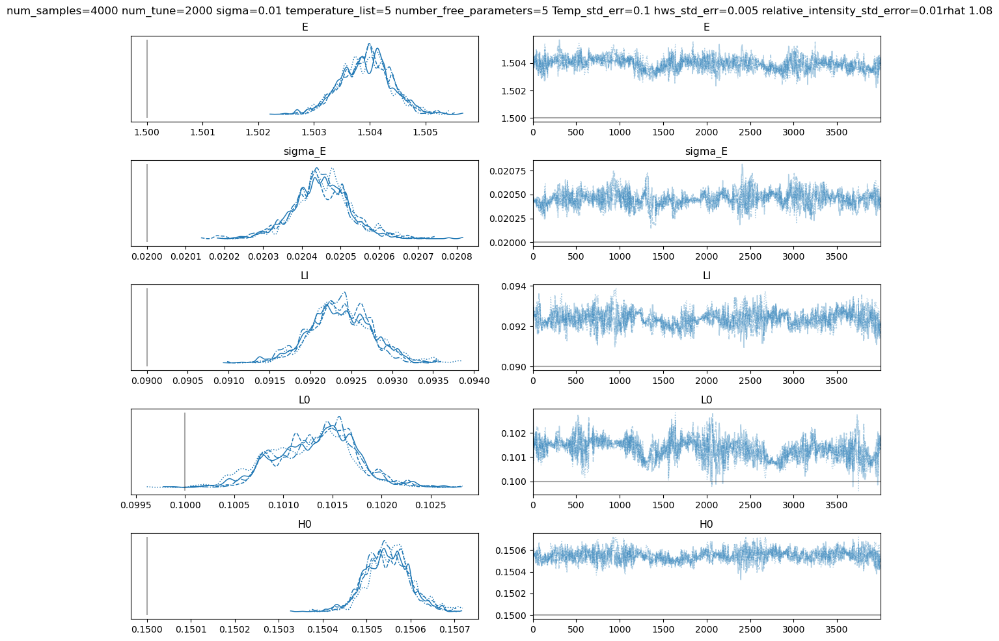

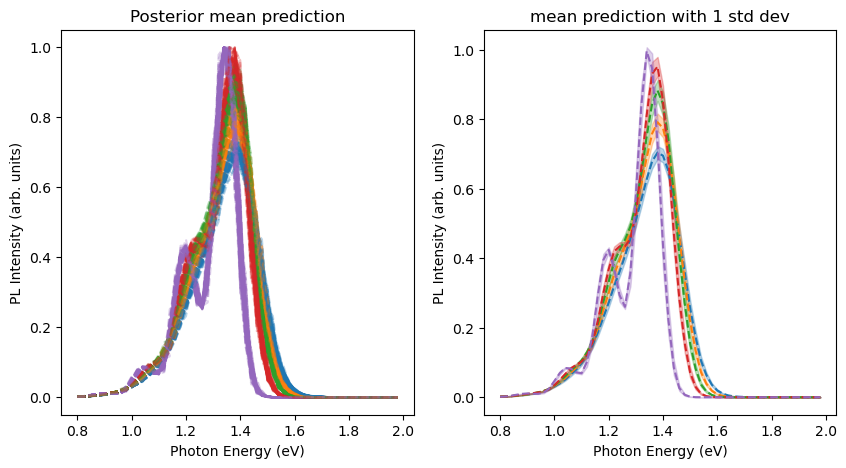

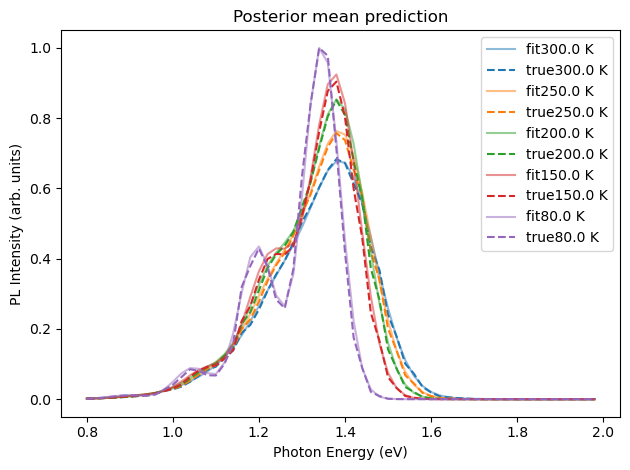

In [16]:
for name,model in model_dict.items():
    #if int(name.split('number_free_parameters=')[1][0]) ==5 and int(name.split('temperature_list=')[1][0]) == 5:
        df_summary = arviz.summary(model.idata)
        print(name, df_summary['r_hat'].values.max())
        if df_summary['r_hat'].values.max() < 1.1:
            #print(name, df_summary['r_hat'].values.max())
            print(df_summary)
            print('------------------')
            print('------------------')
            fig = model.plot_trace(true_parameters, save_folder="", savefig=False)
            fig.suptitle(name+f"rhat {df_summary['r_hat'].values.max()}")
            fig.show()
            
            model_config = model.model_config.copy()

            entries_to_remove = ('E', 'LI', 'L0', 'H0', 'sigma_E')
            for k in entries_to_remove:
                model_config.pop(k, None)
            truemodel_pl, true_parameters = test_FIT_NEW.generate_data(temperature_list, hws, **model_config)

            test_FIT_NEW.plot_generated_data(truemodel_pl, temperature_list, hws, "", savefig=False, model_config=model_config)
            model.plot_posterior_prediction(truemodel_pl,  temperature_list, hws, save_folder="", savefig=False)

            

        


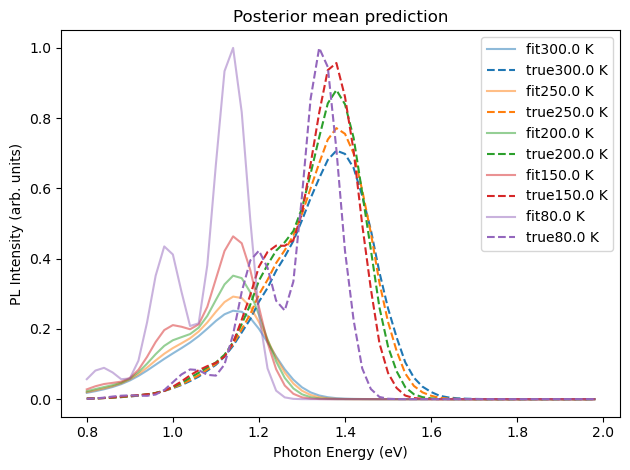

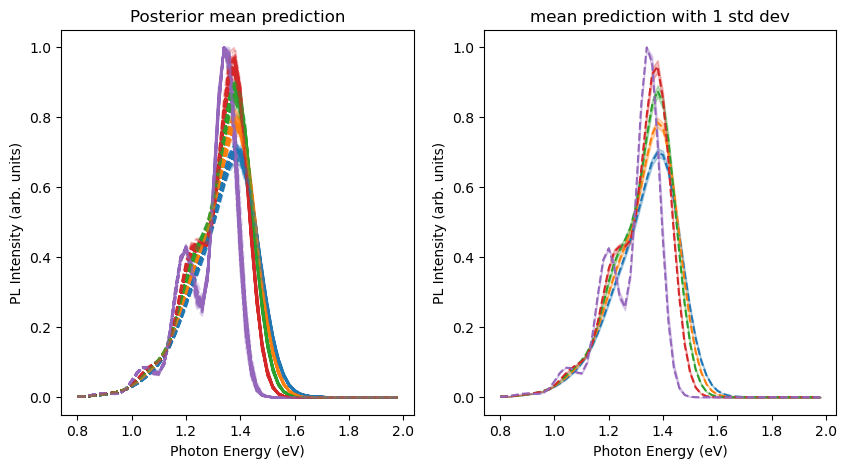

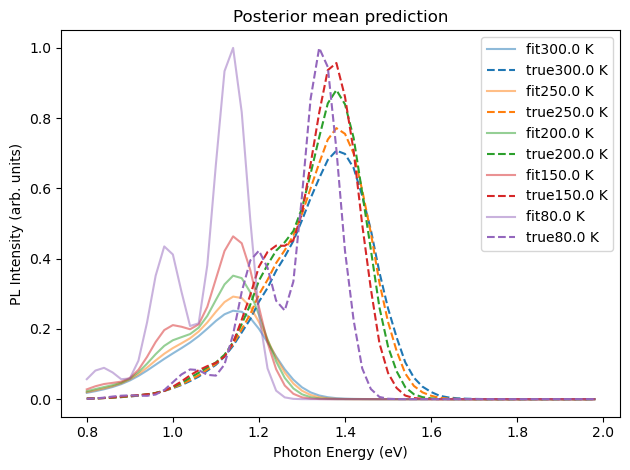

In [34]:
truemodel_pl, true_parameters = test_FIT_NEW.generate_data(temperature_list, hws, **model_config)

test_FIT_NEW.plot_generated_data(truemodel_pl, temperature_list, hws, "", savefig=False, model_config=model_config)
model.plot_posterior_prediction(truemodel_pl,  temperature_list, hws, save_folder="", savefig=False)

(<Figure size 1500x1000 with 2 Axes>,
 <Axes: title={'center': 'Posterior mean prediction'}, xlabel='Photon Energy (eV)', ylabel='PL Intensity (arb. units)'>)

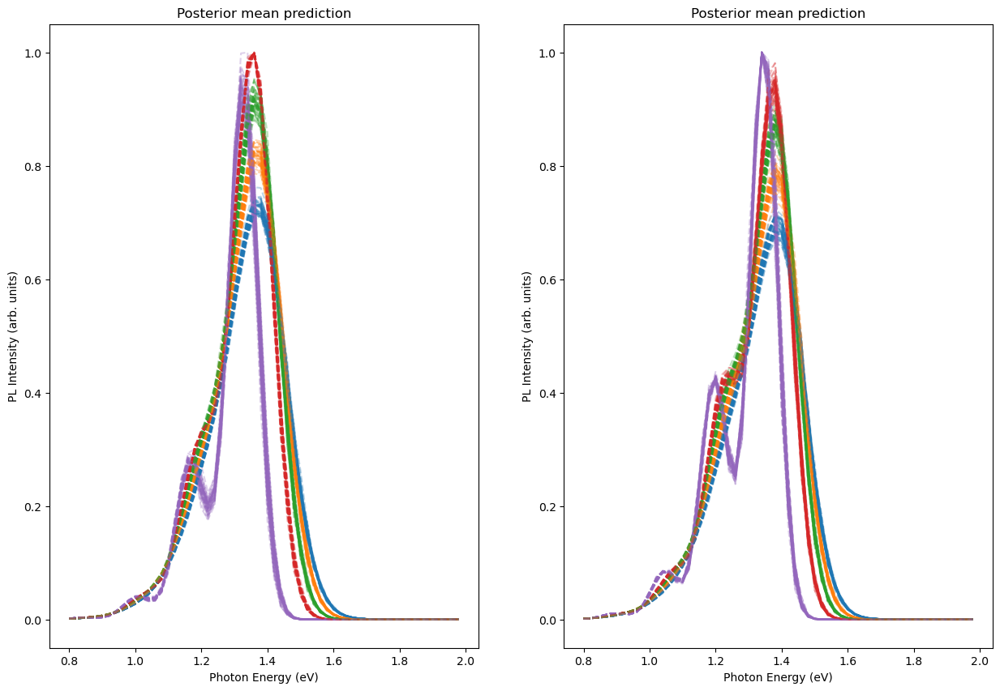

In [21]:
import matplotlib.pyplot as plt 
def generate_data_new(temperature_list, hws,sigma,Temp_std_err,hws_std_err,relative_intensity_std_error,number_free_parameters,true_parameters=None,**kwargs):
    if true_parameters is None:
        E_true = 1.5
        sigma_true = 0.02
        LI_true = 0.09
        L0_true = 0.1
        H0_true = 0.15
        true_parameters = [E_true, sigma_true, LI_true, L0_true, H0_true]
    else:
        E_true, sigma_true, LI_true, L0_true, H0_true = true_parameters
    # error in the temperature of the sample
    temperature_list = temperature_list+np.random.normal(0, Temp_std_err, len(temperature_list))
    # error in the detection wavelength
    hws = hws+np.random.normal(0, hws_std_err, len(hws))
    truemodel_pl = PLPYMCModel.pl_trial(
        [E_true, sigma_true, LI_true, L0_true, H0_true], temperature_list, hws
    ) 
    # relative intensity error
    relative_intensity_model = np.max(truemodel_pl, axis=0)/max(truemodel_pl.reshape(-1, 1))
    relative_intensity_model_error = relative_intensity_model + np.random.normal(0, relative_intensity_std_error, len(relative_intensity_model))
    relative_intensity_model_error= relative_intensity_model_error/np.max(relative_intensity_model_error)
    truemodel_pl=truemodel_pl * relative_intensity_model_error / relative_intensity_model
    relative_intensity_model = np.max(truemodel_pl, axis=0)/max(truemodel_pl.reshape(-1, 1))
    # uniform error accross the spectrum
    truemodel_pl = truemodel_pl+np.random.normal(0, sigma, size=(len(hws), len(temperature_list)))

    return truemodel_pl, true_parameters
def plot_generated_data(true_parameters, temperature_list, hws, save_folder, model_config, savefig=True,fig=None,ax=None):
    if fig is None:
        fig, ax = plt.subplots()
    for x in range(50):
        truemodel_pl, true_parameters = generate_data_new(temperature_list, hws, **model_config,true_parameters=true_parameters)
        data_true_plot = truemodel_pl.reshape(len(hws), -1)
        
        for i in range(len(temperature_list)):
            ax.plot(
                hws,
                data_true_plot[:, i]/max(data_true_plot.reshape(-1, 1)),
                label="true" + str(temperature_list[i]) + " K",
                linestyle="--",
                color="C" + str(i),
                alpha=0.3,
            )
        ax.set_xlabel("Photon Energy (eV)")
        ax.set_ylabel("PL Intensity (arb. units)")
        ax.set_title("Posterior mean prediction")
    if savefig:
        fig.savefig(save_folder + "/generated_data.png")
    return fig, ax
fig, ax = plt.subplots(1,2,figsize=(15,10))
true_parameters=[1.5,0.02,0.07,0.12,0.16]

plot_generated_data(true_parameters, temperature_list, hws, "", savefig=False, model_config=model_config,fig=fig,ax=ax[0])
true_parameters=[1.5,0.02,0.09,0.1,0.15]

plot_generated_data(true_parameters, temperature_list, hws, "", savefig=False, model_config=model_config,fig=fig,ax=ax[1])

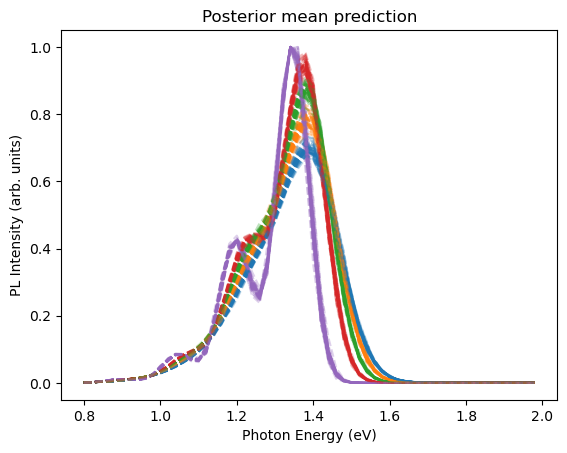

In [14]:
true_parameters=[1.5,0.02,0.09,0.1,0.15]
truemodel_pl, true_parameters = generate_data_new(temperature_list, hws, **model_config,true_parameters=true_parameters)

test_FIT_NEW.plot_generated_data(truemodel_pl, temperature_list, hws, "", savefig=False, model_config=model_config)

{'number_free_parameters': 5, 'E': {'min': 1.0, 'max': 2.0}, 'sigma_E': {'min': 0.001, 'max': 0.03}, 'LI': {'mu': 0.12, 'sigma': 0.01, 'lower': 0.05, 'upper': 0.2}, 'L0': {'mu': 0.12, 'sigma': 0.01, 'lower': 0.05, 'upper': 0.2}, 'H0': {'mu': 0.12, 'sigma': 0.01, 'lower': 0.05, 'upper': 0.2}, 'Temp_std_err': 0.1, 'hws_std_err': 0.002, 'relative_intensity_std_error': 0.05, 'sigma': 0.02}


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
E,1.512,0.031,1.460,1.576,0.008,0.006,20.0,40.0,1.17
sigma_E,0.021,0.006,0.012,0.030,0.002,0.002,9.0,11.0,1.41
LI,0.091,0.021,0.052,0.117,0.009,0.007,5.0,11.0,2.01
L0,0.103,0.043,0.050,0.182,0.018,0.013,6.0,28.0,1.87
H0,0.153,0.017,0.134,0.192,0.008,0.006,5.0,12.0,2.01


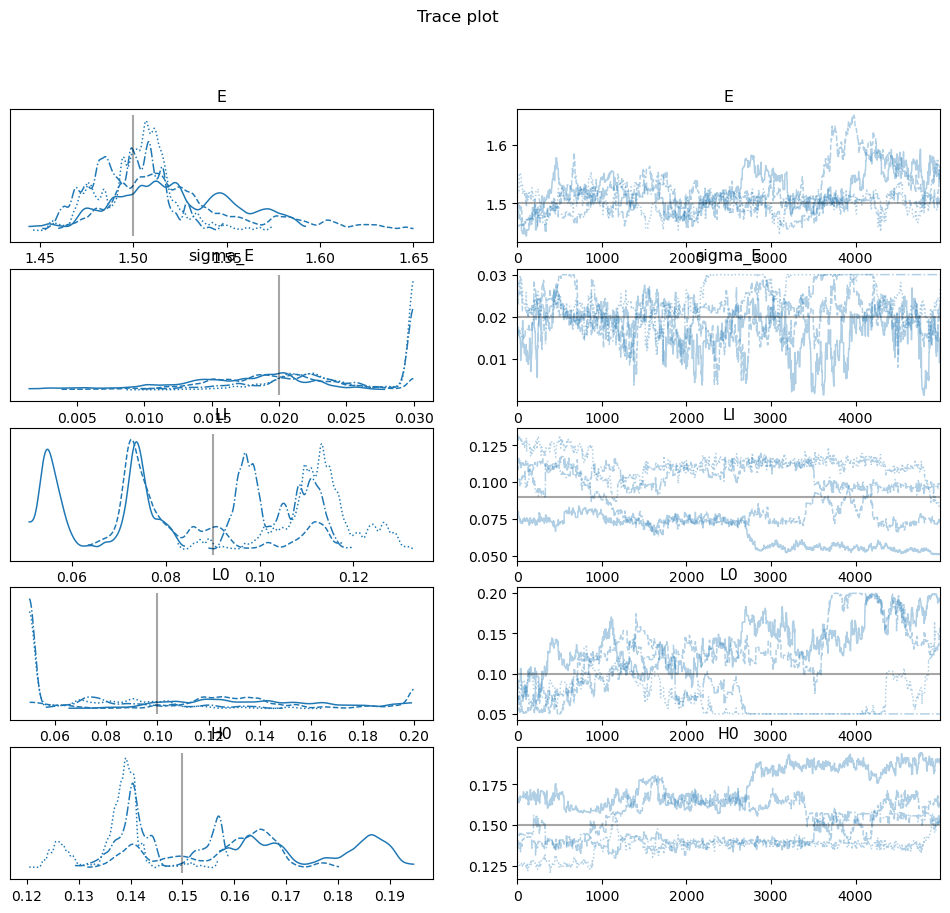

In [12]:
from pl_temp_fit import PLPYMCModel
E_true = 1.5
sigma_true = 0.02
LI_true = 0.09
L0_true = 0.1
H0_true = 0.15
true_parameters = [E_true, sigma_true, LI_true, L0_true, H0_true]
model = PLPYMCModel.PLPYMCModel()
model_2 = model.load(f'{f}/model.nc')
model_2.plot_trace(true_parameters, save_folder="", savefig=False)
print(model_2.model_config)
df_summary = arviz.summary(model_2.idata)

In [67]:
df_summary = arviz.summary(model_2.idata)

array([[<Axes: title={'center': 'E'}>, <Axes: title={'center': 'E'}>],
       [<Axes: title={'center': 'sigma_E'}>,
        <Axes: title={'center': 'sigma_E'}>],
       [<Axes: title={'center': 'LI'}>, <Axes: title={'center': 'LI'}>],
       [<Axes: title={'center': 'L0'}>, <Axes: title={'center': 'L0'}>],
       [<Axes: title={'center': 'H0'}>, <Axes: title={'center': 'H0'}>]],
      dtype=object)

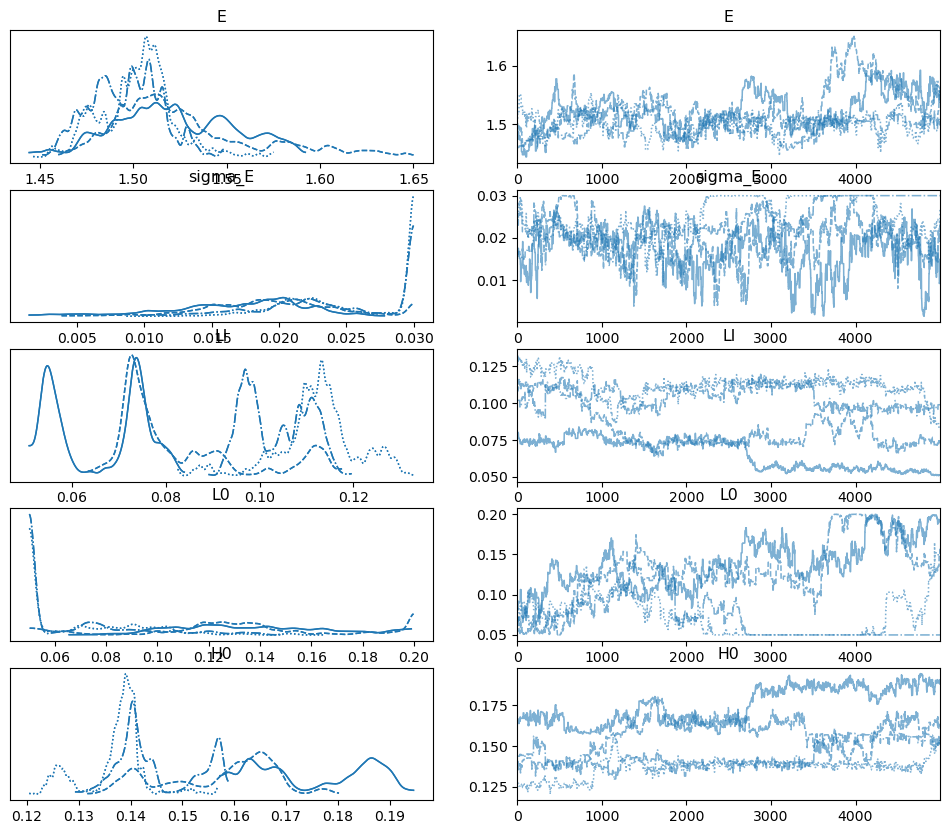

In [75]:
concat_data = arviz.concat([model_2.idata, model_2.idata], dim='chain')
arviz.summary(concat_data)  
arviz.plot_trace(concat_data, var_names=['E', 'sigma_E', 'LI', 'L0', 'H0'], compact=True)

In [79]:
model_2.idata

Inference data with groups:
	> posterior
	> sample_stats
	> prior

array([[<Axes: title={'center': 'E'}>, <Axes: title={'center': 'E'}>],
       [<Axes: title={'center': 'sigma_E'}>,
        <Axes: title={'center': 'sigma_E'}>],
       [<Axes: title={'center': 'LI'}>, <Axes: title={'center': 'LI'}>],
       [<Axes: title={'center': 'L0'}>, <Axes: title={'center': 'L0'}>],
       [<Axes: title={'center': 'H0'}>, <Axes: title={'center': 'H0'}>]],
      dtype=object)

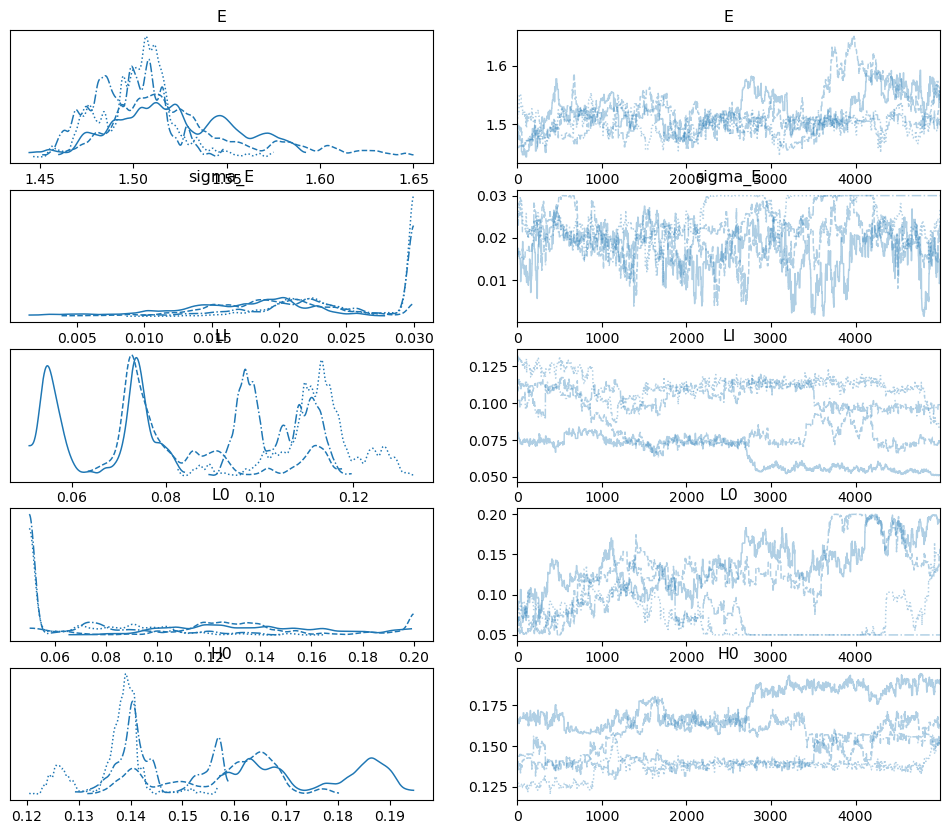

In [76]:
arviz.summary(model_2.idata)
arviz.plot_trace(model_2.idata, var_names=['E', 'sigma_E', 'LI', 'L0', 'H0'], compact=True)